In [1]:
!pip install pytesseract

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [21]:
import matplotlib.pyplot as plt
from pdf2txt.core import Document
from pdf2txt.core.region import RegionExtractor
from pdf2txt.utils import calculate_area
import matplotlib.pyplot as plt
from pdf2txt.table import TableFinder
from pdf2txt import utils
import numpy as np

pdf0 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/CGF_HBFU_I-fact-202006-proffrfr.pdf"
pdf1 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/Aviva Investors Global Convertibles Absolute Return Fund Class I - Factsheet.pdf"
pdf2 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/FACSHT-FR-FR0010321828.pdf"
pdf3 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/Factsheet_FR0010137174_FRE_FRA_2020-09-30.pdf"
pdf4 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/FF_LU1711708690_LU-en.pdf"
pdf5 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/FLF_CGE_LU0099161993_FR_FR.pdf"
pdf6 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/LO Funds - Convertible Bonds.pdf"
pdf7 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/NN (L) Global Convertible Opportunities.pdf"
pdf8 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/pro.en.xx.LU0238205446.pdf"
pdf9 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Fact sheets/SPDR® Refinitiv Global Convertible Bond UCITS ETF (Dist).pdf"    
pdf10="/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Development/Python/pdf2text/pdfs/JPM Emerging Markets Corporate Bond C (acc) - USD[LU_EN][5_10_2021].pdf"
pdf11="pdfs/BNP Euro Valmeurs Durables.pdf"
pdf12="pdfs/Carmignac Grande Europe Factsheet_LU0099161993_LU_EN.pdf"
pdf13="pdfs/Fidelity Sustainable Eurozone Equity Factsheet LU0238202773.pdf"
pdf14="pdfs/JPM Europe Sustainable Equity I (acc) - EUR[LU_EN][10_27_2020].pdf"
pdf15="pdfs/LFDE Major growth Europe - Factsheet - FR-FR0010321828.pdf"
pdf16="pdfs/Nordea European Equity Starts Facsheet.pdf"
pdf17="pdfs/OFI Invest Ethical European Equity.pdf"
pdf18="pdfs/Pictet Quest Eur. Sust Eq-P EUR_FACTSHEET_LU0144509717_EN_DEFAULT_30Sep2020.pdf"
pdf19="pdfs/Robeco Sustainable European Stars Equities Factsheet.pdf"
pdf20 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Development/Python/candriam_entities_api/pdfs/dnca-invest-convertibles_lu0401808935.pdf"
pdf21= "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Development/Python/pdf2text/pdfs/Aviva Investors Global Convertibles Absolute Return Fund Class I - Factsheet.pdf"
pdf22="/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Factsheets Convertibles/dnca-invest-convertibles_lu0401808935.pdf"
pdf23 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Clients/CANDIAM/POC_Structuration/Factsheets Convertibles/NN (L) Global Convertible Opportunities.pdf"
pdf24="/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Development/Python/candriam_entities_api/pdfs/JPM Global Convertibles (EUR) I (acc) - EUR.pdf"
pdf25 = "/Users/mohamedmentis/Dropbox/My Mac (MacBook-Pro.local)/Documents/Mentis/Development/Python/pdf2text/pdfs/LFDE Major growth Europe - Factsheet - FR-FR0010321828.pdf"

pdfs=[pdf0, pdf1,pdf2,pdf3,pdf4,pdf5,pdf6,pdf7, pdf8,pdf9, pdf10 , pdf11, pdf12, pdf13, pdf14, pdf15, pdf16, pdf17, pdf18, pdf19, pdf20, pdf21,pdf22, pdf23, pdf24, pdf25]


In [22]:
    def prepare_image(image, page, crop_bottom=400, remove_images=True):


        if remove_images:
            for im in page.images:
                cv2.rectangle(image, (int(im.left/page.pdf_width_scaler),int(im.top/page.pdf_height_scaler)), (int(im.right/page.pdf_width_scaler), int(im.bottom/page.pdf_height_scaler)), (255, 255, 255), -1)

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Performing OTSU threshold
        ret, thresh1 = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

        # Specify structure shape and kernel size.
        # Kernel size increases or decreases the area
        # of the rectangle to be detected.
        # A smaller value like (10, 10) will detect
        # each word instead of a sentence.
        rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13))

        # Appplying dilation on the threshold image
        dilation = cv2.dilate(thresh1, rect_kernel, iterations=1)

        # Finding contours
        contours, hierarchy = cv2.findContours(dilation, cv2.RETR_EXTERNAL,
                                               cv2.CHAIN_APPROX_NONE)

        # Looping through the identified contours
        # Then rectangular part is cropped and passed on
        # to pytesseract for extracting text from it
        # Extracted text is then written into the text file
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)

            # Drawing a rectangle on copied image
            if h < 2000 and w <2000:
                rect = cv2.rectangle(image, (x, y), (x + w, y + h), (24, 25, 25), 2)

        for gt in page.graphs+page.tables:
            cv2.rectangle(image, (int(gt.left/page.pdf_width_scaler), int(gt.top/page.pdf_height_scaler)), (int(gt.right/page.pdf_width_scaler),int(gt.bottom/page.pdf_height_scaler)), (2,2,2), 6)
            cv2.line(image, (int(gt.left/page.pdf_width_scaler), int(gt.top/page.pdf_height_scaler)), (int(gt.right/page.pdf_width_scaler),int(gt.bottom/page.pdf_height_scaler)), (2,2,2), 6)
        h, w, _ = image.shape
        cv2.rectangle(image, (0, h - crop_bottom), (w, h), (255, 255, 255), -1)


        
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (7, 7), 0)
        thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)


        blur = cv2.bitwise_not(blur)
        bw = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)

        horizontal = np.copy(bw)
        vertical = np.copy(bw)
        # [init]
        # [horiz]
        # Specify size on horizontal axis
        cols = horizontal.shape[1]
        horizontal_size = cols // 30

        # Create structure element for extracting horizontal lines through morphology operations
        horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
        # Apply morphology operations
        horizontal = cv2.erode(horizontal, horizontalStructure)
        horizontal = cv2.dilate(horizontal, horizontalStructure)
        # Show extracted horizontal lines

        img_blur = thresh + horizontal

        vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1000))
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2000, 1))
        horizontal_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)

        vertical_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, vertical_kernel, iterations=1)

        total_mask = cv2.bitwise_or(horizontal_mask, vertical_mask)

        img_blur[np.where(total_mask != 0)] = 0

        return img_blur
    


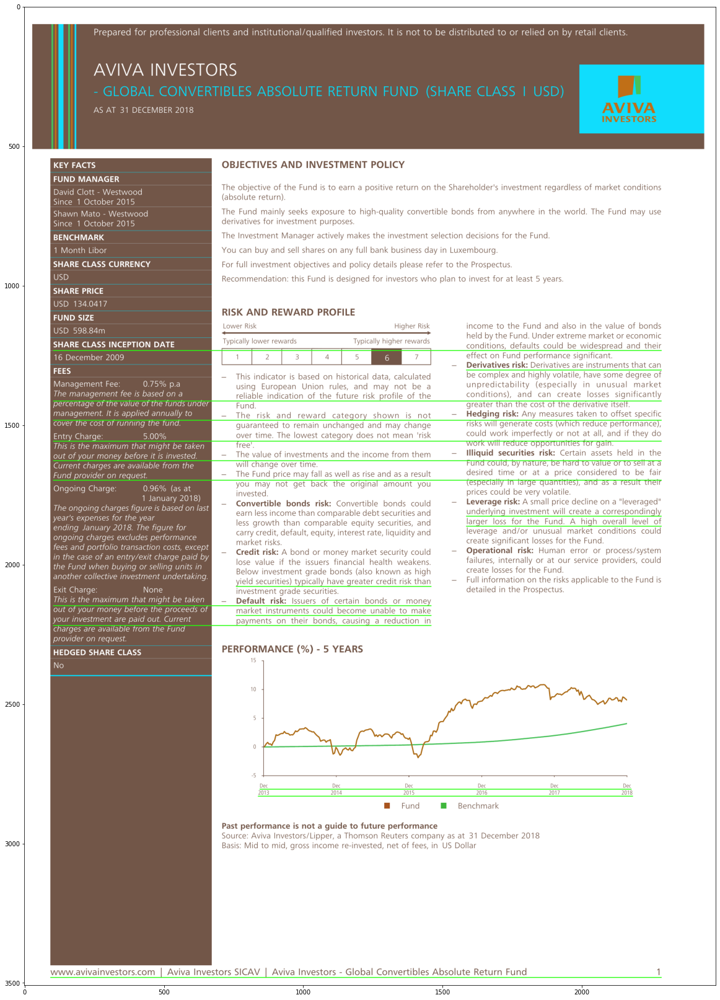

In [24]:
from pdf2txt.graph import extract_graphs
from pdf2txt.utils import BoundingBox, join_collated_h_edges
from pdf2txt.table import TableFinder
import cv2
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (20,30)

pdf_doc=Document.open(pdfs[21])
p0=pdf_doc.pages[0]
tf=TableFinder(p0)
lines = join_collated_h_edges(tf.guess_table_lines())
image=p0.page_image

for c in lines:
    cv2.rectangle(image, (int(c.left/p0.pdf_width_scaler), int(c.top/p0.pdf_height_scaler)), (int(c.right/p0.pdf_width_scaler),int(c.bottom/p0.pdf_height_scaler)), (36,255,12), 2)

plt.imshow(image)

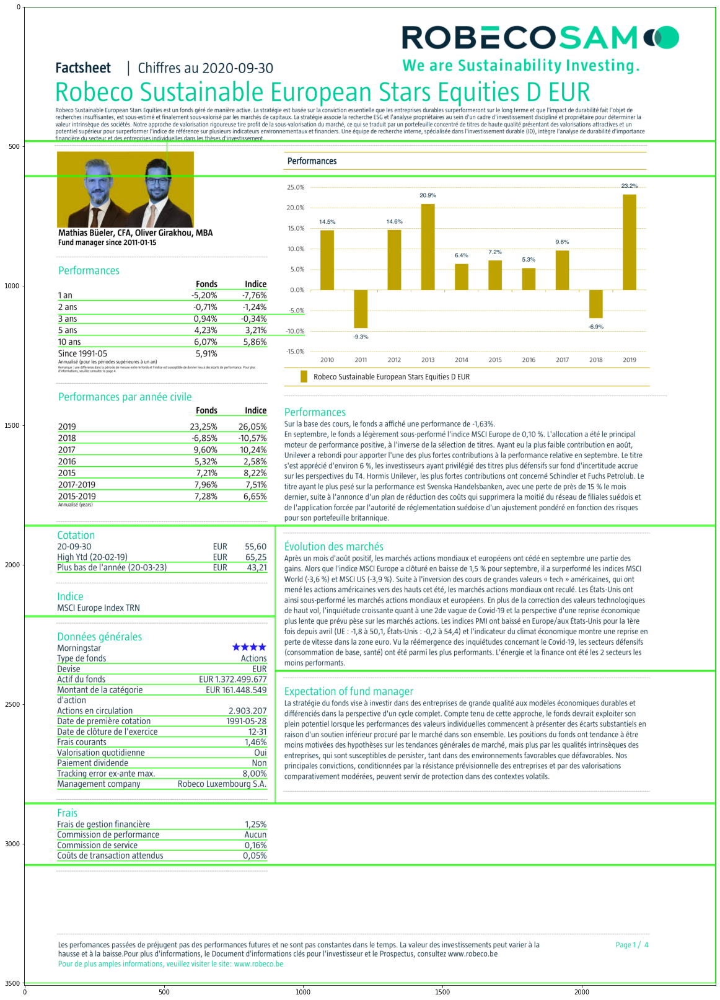

In [8]:
from pdf2txt.graph import extract_graphs
from pdf2txt.utils import BoundingBox
import cv2
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (20,30)

#pdf_doc=Document.open(pdfs[10])
p0=pdf_doc.pages[0]
re=RegionExtractor()
tf= TableFinder(p0)

regions=re.extract_regions(p0)


image=p0.page_image

cv2.imwrite('image.jpg', image) 
for c in regions:
    cv2.rectangle(image, (int(c.left/p0.pdf_width_scaler), int(c.top/p0.pdf_height_scaler)), (int(c.right/p0.pdf_width_scaler),int(c.bottom/p0.pdf_height_scaler)), (36,255,12), 2)

  
plt.imshow(image)

In [16]:
!pip3 install regex

     |████████████████████████████████| 284 kB 5.9 MB/s eta 0:00:01


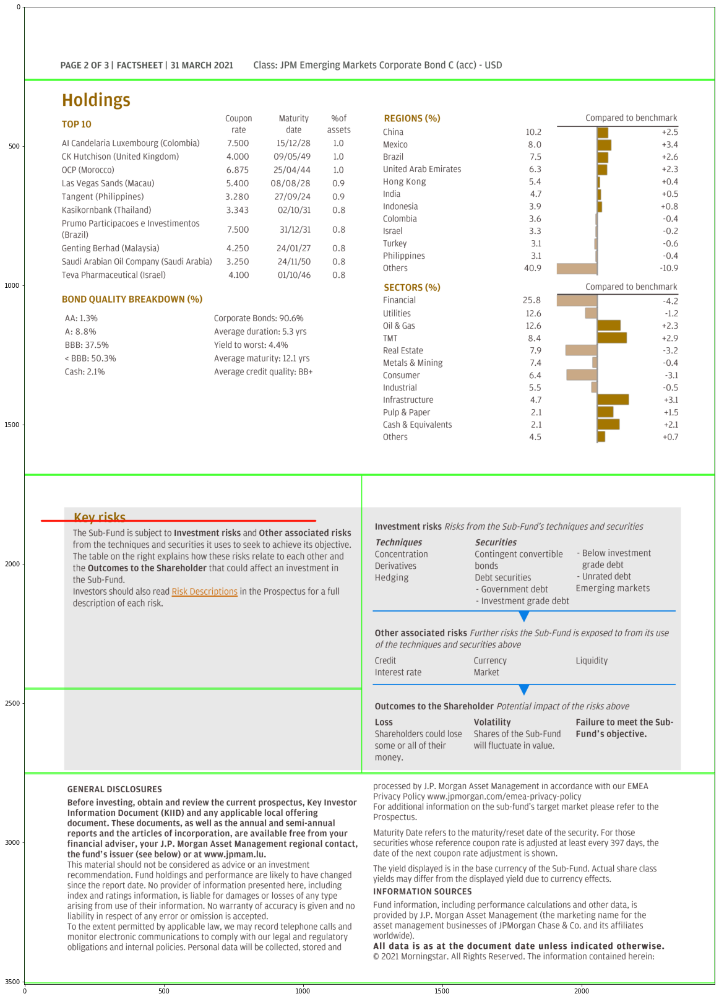

In [3]:
p0=pdf_doc.pages[1]
re=RegionExtractor()
tf= TableFinder(p0)

regions=re.extract_regions(p0)


image=p0.page_image

for c in p0.graphs:
    cv2.rectangle(image, (int(c.left/p0.pdf_width_scaler), int(c.top/p0.pdf_height_scaler)), (int(c.right/p0.pdf_width_scaler),int(c.bottom/p0.pdf_height_scaler)), (36,25,12), 2)

for c in regions:
    cv2.rectangle(image, (int(c.left/p0.pdf_width_scaler), int(c.top/p0.pdf_height_scaler)), (int(c.right/p0.pdf_width_scaler),int(c.bottom/p0.pdf_height_scaler)), (36,255,12), 2)

  
cv2.rectangle(image, (int(15/p0.pdf_width_scaler), int(443/p0.pdf_height_scaler)), (int(251/p0.pdf_width_scaler),int(443/p0.pdf_height_scaler)), (255,25,12), 6)

plt.imshow(image)

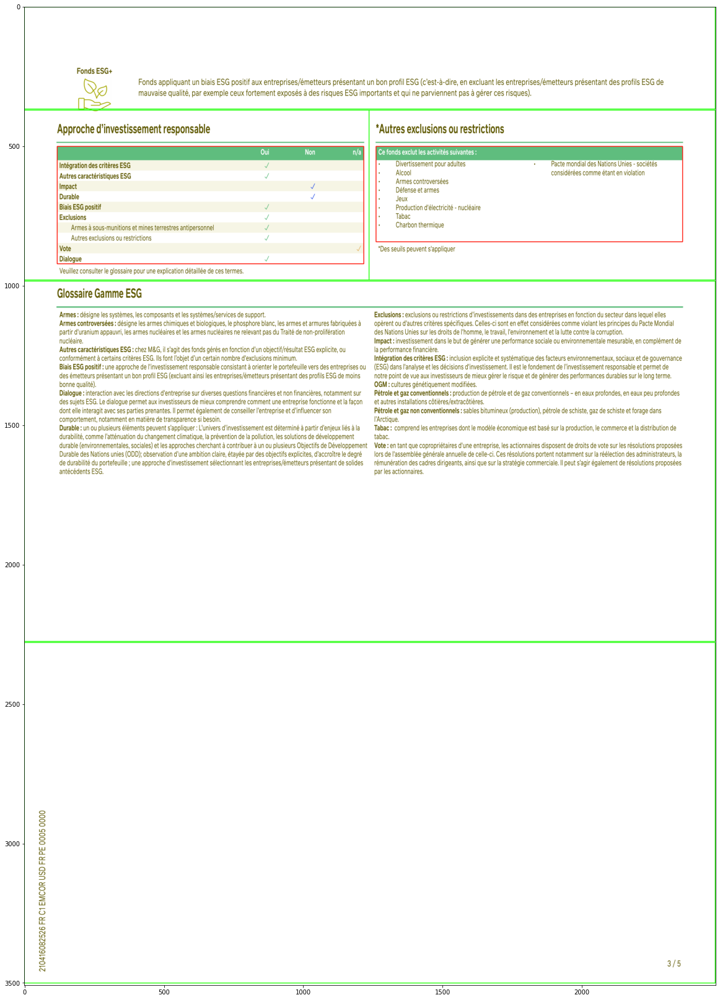

In [6]:

p0=pdf_doc.pages[2]
re=RegionExtractor()
tf= TableFinder(p0)

regions=re.extract_regions(p0)


image=p0.page_image
tables=tf.guess_tables()

for c in p0.tables:
    cv2.rectangle(image, (int(c.left/p0.pdf_width_scaler), int(c.top/p0.pdf_height_scaler)), (int(c.right/p0.pdf_width_scaler),int(c.bottom/p0.pdf_height_scaler)), (255,25,12), 2)


for c in regions:
    cv2.rectangle(image, (int(c.bbox.left/p0.pdf_width_scaler), int(c.bbox.top/p0.pdf_height_scaler)), (int(c.bbox.right/p0.pdf_width_scaler),int(c.bbox.bottom/p0.pdf_height_scaler)), (36,255,12), 2)
#(93.8611 87.07100000000003 93.8611 155.03100000000006 )
#cv2.rectangle(image, (int(98/p0.pdf_width_scaler), int(87/p0.pdf_height_scaler)), (int(197/p0.pdf_width_scaler),int(155/p0.pdf_height_scaler)), (36,255,120), 10)
  
plt.imshow(image)

0.24
0.24
0.24
0.24
0.24
0.24
0.24
0.24
0.24


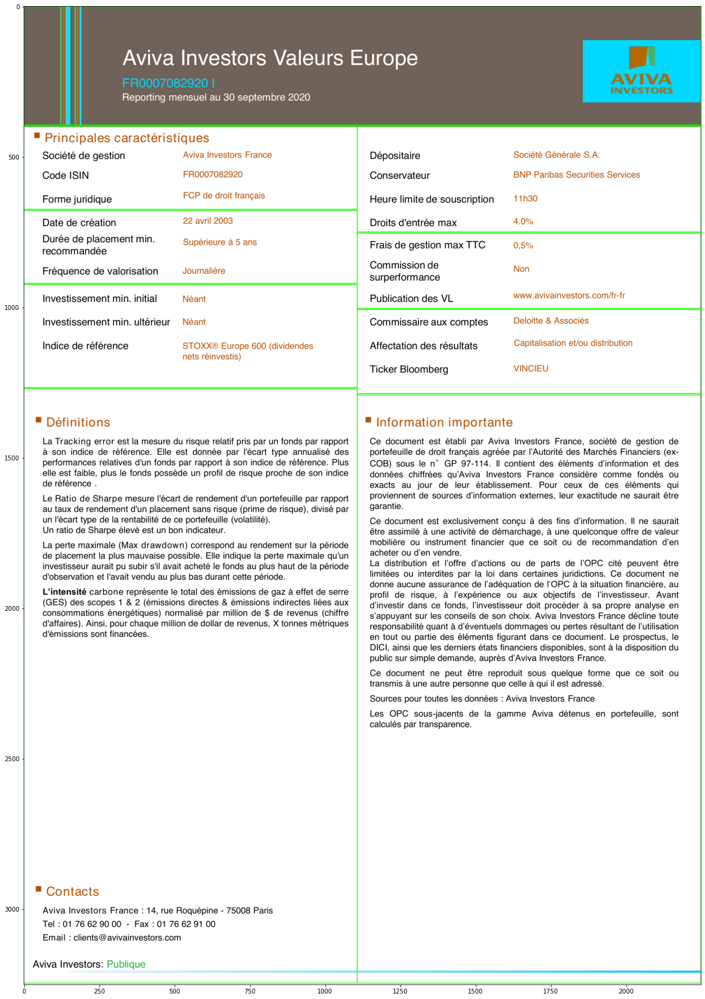

In [5]:
p0=pdf_doc.pages[3]
re=RegionExtractor()
tf= TableFinder(p0)

regions=re.extract_regions(p0)

#tf.guess_table_lines
image=p0.page_image

for c in regions:
    cv2.rectangle(image, (int(c.bbox.left/p0.pdf_width_scaler), int(c.bbox.top/p0.pdf_height_scaler)), (int(c.bbox.right/p0.pdf_width_scaler),int(c.bbox.bottom/p0.pdf_height_scaler)), (36,255,12), 2)
    print(p0.pdf_width_scaler)

plt.imshow(image)

In [6]:
p0=pdf_doc.pages[3]
rects=re.extract_regions(p0)
img=p0.to_image()



In [7]:
p0=pdf_doc.pages[4]
#rects=re.regions_from_spaces(p0,horizental_separator_width=5, vertical_separator_width=3, stride=1 ,split_direction='all')
#rects=guess_tables(p0)
rects=re.extract_regions(p0)
img=p0.to_image()


img.draw_rects(rects, stroke=(0, 0, 255))
img.draw_rects(p0.graphs, stroke=(200, 0, 255))

IndexError: list index out of range

In [ ]:
p0=pdf_doc.pages[8]
#rects=re.regions_from_spaces(p0,horizental_separator_width=5, vertical_separator_width=3, stride=1 ,split_direction='all')
#rects=guess_tables(p0)
rects=re.extract_regions(p0)
img=p0.to_image()


img.draw_rects(rects, stroke=(0, 0, 255))
img.draw_rects(p0.graphs, stroke=(200, 0, 255))

In [60]:
import numpy as np

image=p0.page_image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#blur = cv2.GaussianBlur(gray, (3,3), 0)
#thresh = cv2.threshold(gray, 0, 200, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

gray = cv2.bitwise_not(gray)
bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)

horizontal = np.copy(bw)
vertical = np.copy(bw)
        # [init]
        # [horiz]
        # Specify size on horizontal axis
cols = horizontal.shape[1]
horizontal_size = cols // 30

        # Create structure element for extracting horizontal lines through morphology operations
horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
        # Apply morphology operations
horizontal = cv2.erode(horizontal, horizontalStructure)
horizontal = cv2.dilate(horizontal, horizontalStructure)
        # Show extracted horizontal lines


img_blur = bw + horizontal

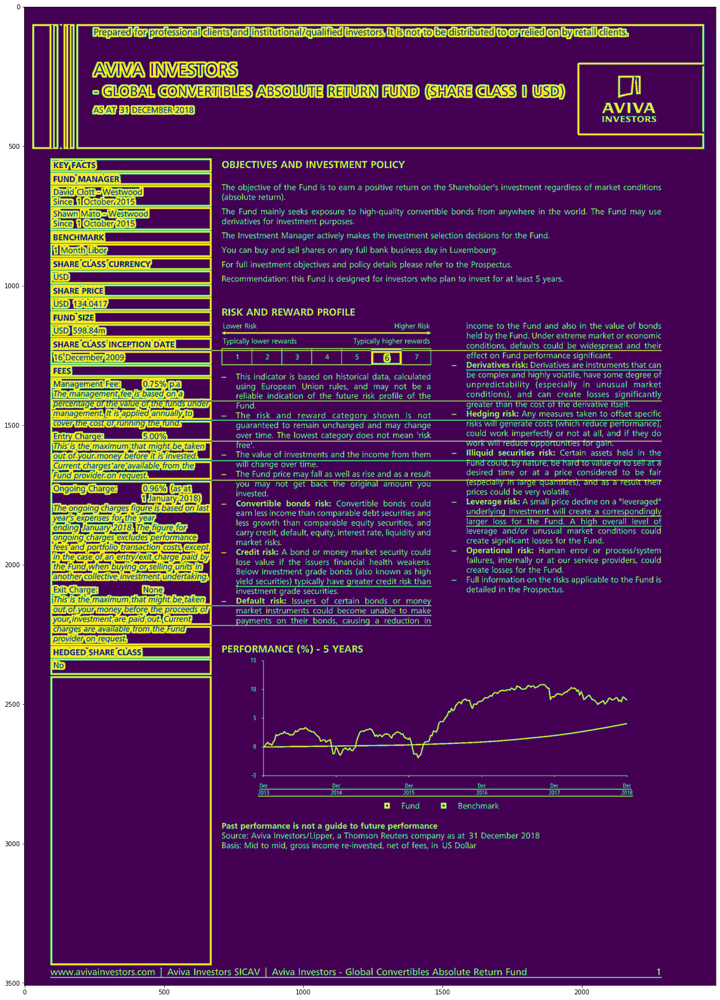

In [62]:
plt.imshow(bw)

In [54]:
import cv2
import numpy as np

# Load image, grayscale, Gaussian blur, Otsu's threshold
image=p0.page_image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.threshold(blur, 0, 200, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Detect horizontal lines
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (500,1))
horizontal_mask = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)

# Detect vertical lines
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,500))
vertical_mask = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=1)

# Combine masks and remove lines
table_mask = cv2.bitwise_or(horizontal_mask, vertical_mask)
image[np.where(vertical_mask==200)] = [255,255,255]

print(table_mask)

[[200 200 200 ... 200 200 200]
 [200 200 200 ... 200 200 200]
 [200 200   0 ...   0   0   0]
 ...
 [200 200   0 ...   0   0   0]
 [200 200   0 ...   0   0   0]
 [200 200   0 ...   0   0   0]]


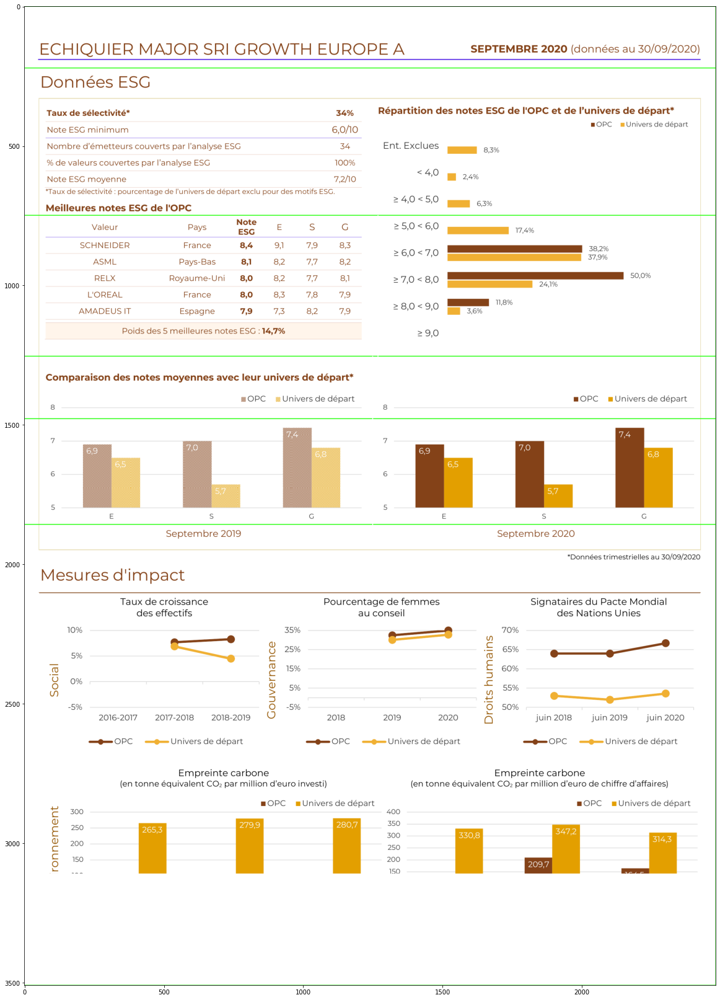

In [55]:
plt.imshow( thresh)
#plt.imshow(horizontal_mask)
#plt.imshow(vertical_mask)
#plt.imshow(table_mask)
plt.imshow(image)

In [3]:
import cv2
import numpy as np
pdf_doc=Document.open(pdfs[21])

p0=pdf_doc.pages[0]
image=p0.page_image
crop_bottom=400

h, w, _ = image.shape
cv2.rectangle(image, (0, h - crop_bottom), (w, h), (255, 255, 255), -1)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)
#thresh = cv2.threshold(blur,220,255,cv.THRESH_BINARY_INV, cv.THRESH_OTSU)[1]
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)

blur = cv2.bitwise_not(blur)
bw = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)

horizontal = np.copy(bw)
vertical = np.copy(bw)
        # [init]
        # [horiz]
        # Specify size on horizontal axis
cols = horizontal.shape[1]
horizontal_size = cols // 30

        # Create structure element for extracting horizontal lines through morphology operations
horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
        # Apply morphology operations
horizontal = cv2.erode(horizontal, horizontalStructure)
horizontal = cv2.dilate(horizontal, horizontalStructure)
        # Show extracted horizontal lines

    


img_blur = thresh + horizontal

vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1000))
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2000, 1))
horizontal_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)

vertical_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, vertical_kernel, iterations=1)


table_mask = cv2.bitwise_or(horizontal_mask, vertical_mask)


img_blur[np.where(table_mask != 0)] = 0


In [13]:
import cv2
import numpy as np
#pdf_doc=Document.open(pdfs[21])

p0=pdf_doc.pages[0]
image=p0.page_image
crop_bottom=400

h, w, _ = image.shape
cv2.rectangle(image, (0, h - crop_bottom), (w, h), (255, 255, 255), -1)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)


blur = cv2.bitwise_not(blur)
bw = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)

horizontal = np.copy(bw)
vertical = np.copy(bw)
        # [init]
        # [horiz]
        # Specify size on horizontal axis
cols = horizontal.shape[1]
horizontal_size = cols // 30

        # Create structure element for extracting horizontal lines through morphology operations
horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
        # Apply morphology operations
horizontal = cv2.erode(horizontal, horizontalStructure)
horizontal = cv2.dilate(horizontal, horizontalStructure)
        # Show extracted horizontal lines

img_blur = thresh + horizontal

vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1000))
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2000, 1))
horizontal_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)

vertical_mask = cv2.morphologyEx(img_blur, cv2.MORPH_OPEN, vertical_kernel, iterations=1)

total_mask = cv2.bitwise_or(horizontal_mask, vertical_mask)

img_blur[np.where(total_mask != 0)] = 0


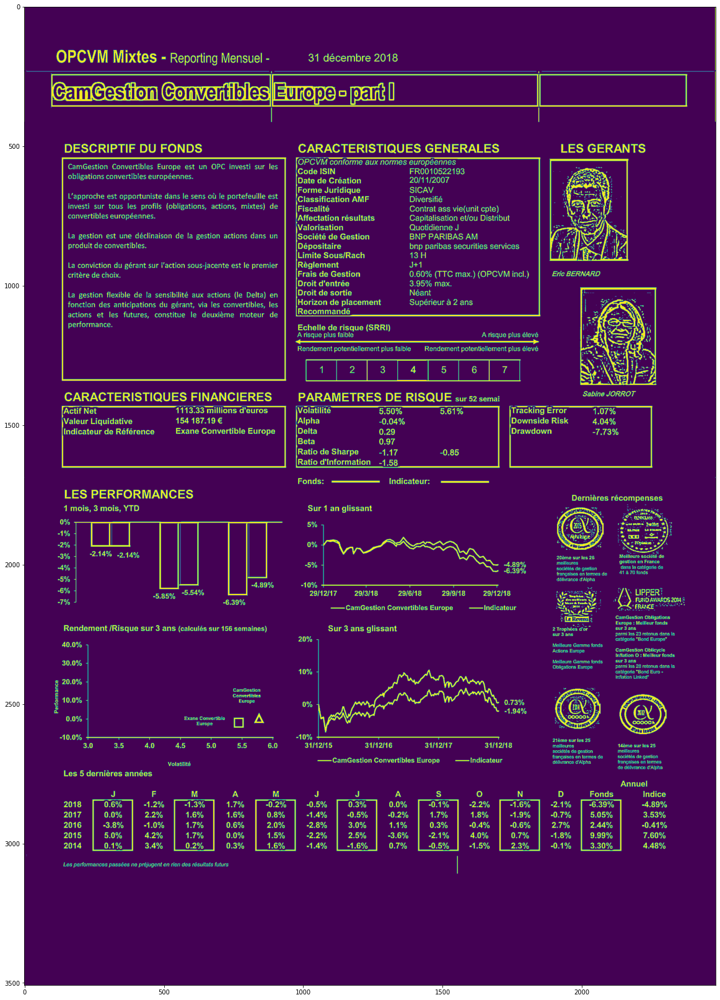

In [14]:
plt.imshow(img_blur)

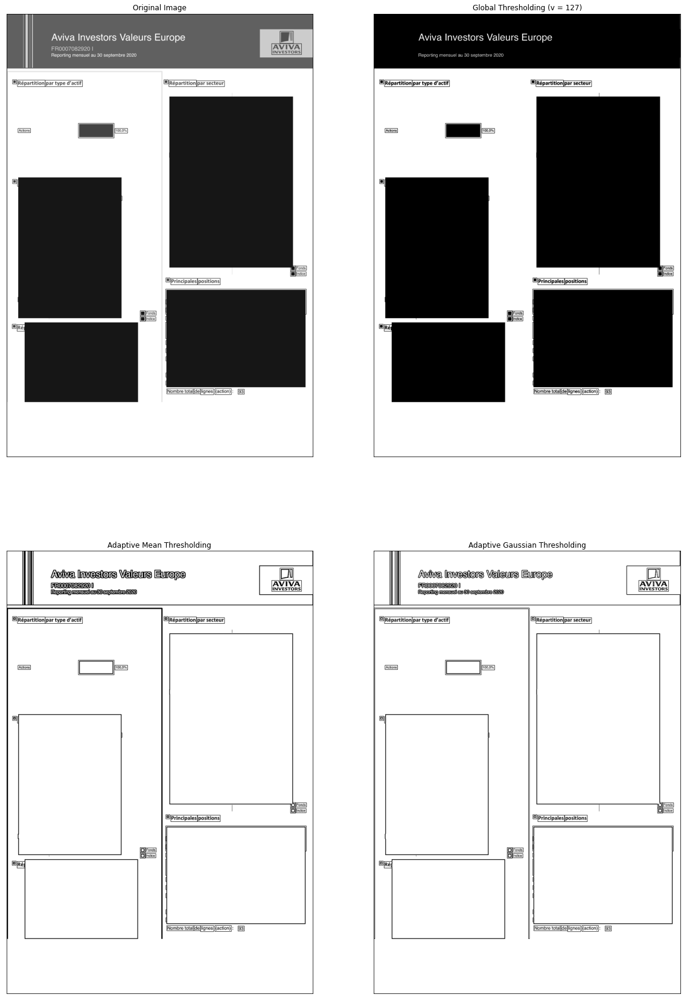

In [7]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img=pdf_doc.pages[1].page_image#img = cv.medianBlur(img,5)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

ret,th1 = cv.threshold(img,220,255,cv.THRESH_BINARY, cv.THRESH_OTSU)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

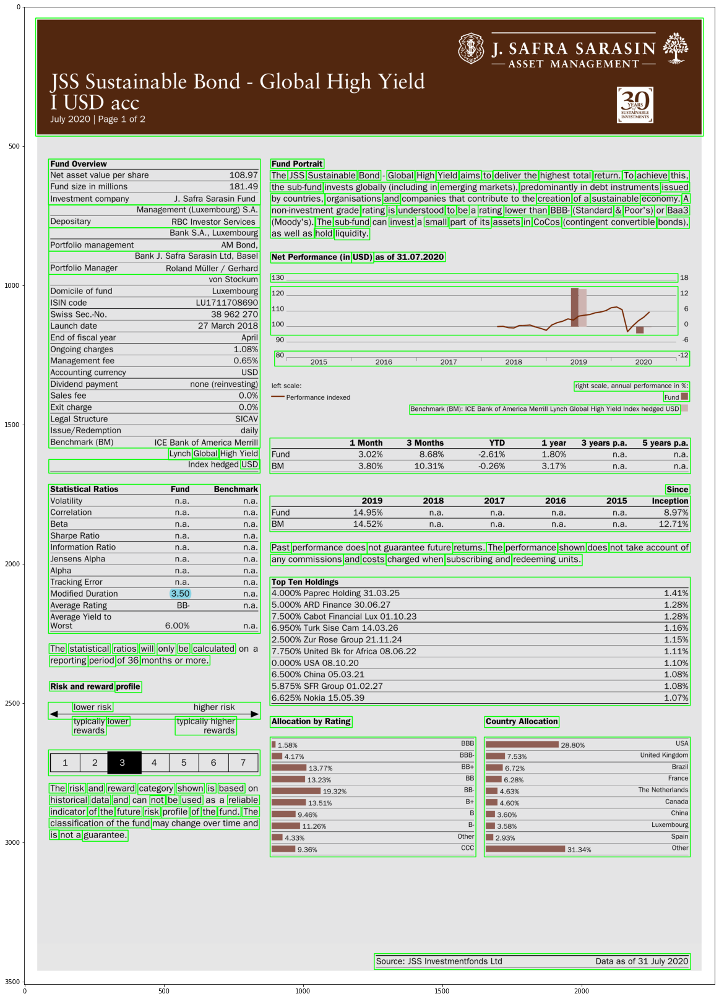

In [18]:
import cv2 
  
# Read image from which text needs to be extracted 
pdf_doc=Document.open(pdfs[4])
p0=pdf_doc.pages[0]
img=p0.page_image
  
# Preprocessing the image starts 
  
# Convert the image to gray scale 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
  
# Performing OTSU threshold 
ret, thresh1 = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV) 
  
# Specify structure shape and kernel size.  
# Kernel size increases or decreases the area  
# of the rectangle to be detected. 
# A smaller value like (10, 10) will detect  
# each word instead of a sentence. 
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13)) 
  
# Appplying dilation on the threshold image 
dilation = cv2.dilate(thresh1, rect_kernel, iterations = 1) 
  
# Finding contours 
contours, hierarchy = cv2.findContours(dilation, cv2.RETR_EXTERNAL,  
                                                 cv2.CHAIN_APPROX_NONE) 
  
# Creating a copy of image 
im2 = img.copy() 
  

# Looping through the identified contours 
# Then rectangular part is cropped and passed on 
# to pytesseract for extracting text from it 
# Extracted text is then written into the text file 
for cnt in contours: 
    x, y, w, h = cv2.boundingRect(cnt) 
      
    # Drawing a rectangle on copied image 
    if h>30 and h< 2000:
        rect = cv2.rectangle(im2, (x, y), (x + w, y + h), (0, 255, 0), 2) 
plt.imshow(im2)

In [39]:
img_blur[np.where(horizental_mask == 255)]

NameError: name 'horizental_mask' is not defined

In [86]:
from pdf2txt.utils import BoundingBox, get_partially_overlapping_objects


def build_axis_from_edges(edge_rects, all_rectangles, direction='h'):
    edge = {}

    if direction == 'h':
        edge['axis'] = BoundingBox(left=min(rect.left for rect in edge_rects),
                                   right=max(rect.right for rect in edge_rects),
                                   top=min(rect.bottom for rect in edge_rects)-20,
                                   bottom=min(rect.bottom for rect in edge_rects)+20)
        edge['orientation'] = 'h'
    elif direction == 'v':
        edge['axis'] = BoundingBox(left=min(rect.left for rect in edge_rects),
                                   right=min(rect.left for rect in edge_rects),
                                   top=min(rect.top for rect in edge_rects),
                                   bottom=max(rect.bottom for rect in edge_rects))
        
        edge['orientation'] = 'v'
    else:
        raise Exception("wrong direction. Should be either 'h' for horizontal  or 'v' for vertical")
    edge['components'] = get_partially_overlapping_objects(edge['axis'], all_rectangles)
    edge['bbox'] = BoundingBox(left=min(rect.left for rect in edge['components']),
                               right=max(rect.right for rect in edge['components']) + 5,
                               top=min(rect.top for rect in edge['components']) - 10,
                               bottom=max(rect.bottom for rect in edge['components']))
    edge['axis'] = BoundingBox(left=min(rect.left for rect in edge['components']),
                                   right=min(rect.left for rect in edge['components']),
                                   top=min(rect.top for rect in edge['components']),
                                   bottom=max(rect.bottom for rect in edge['components']))


    return edge

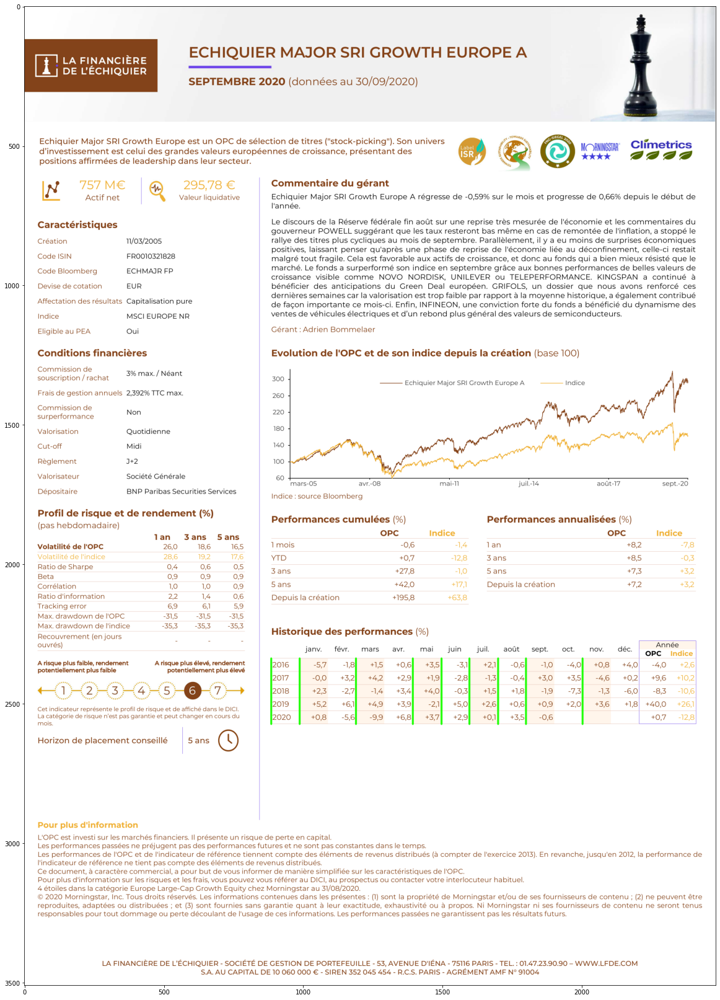

In [4]:
from pdf2txt.utils import contains_objects
from pdf2txt.graph import rects_to_edges

from matplotlib import pyplot as plt
import cv2
plt.rcParams["figure.figsize"] = (20,30)

pdf_doc=Document.open(pdfs[2])
page=pdf_doc.pages[0]


#regions=re.extract_regions(p0)


image=page.page_image.copy()

rectangles_=page.rects+[c for c in page.curves if c.width<100 and c.height<100]
#sometimes there are duplicates in regtangle list due to pdf objects defined twice
rectangles=[]
for r in rectangles_:
    if not contains_objects(r, rectangles):
        rectangles.append(r)


edges = rects_to_edges(rectangles, page.tokens, rect_threshold=2)

#for c in rectangles:
#        cv2.rectangle(image, (int(c.left/page.pdf_width_scaler), int(c.top/page.pdf_height_scaler)), (int(c.right/page.pdf_width_scaler),int(c.bottom/page.pdf_height_scaler)), (36,25,255), 4)


for c in edges['v']:
    cv2.rectangle(image, (int(c['axis'].left/page.pdf_width_scaler), int(c['axis'].top/page.pdf_height_scaler)), (int(c['axis'].right/page.pdf_width_scaler),int(c['axis'].bottom/page.pdf_height_scaler)), (36,255,12), 6)

for c in edges['h']:
    cv2.rectangle(image, (int(c['axis'].left/page.pdf_width_scaler), int(c['axis'].top/page.pdf_height_scaler)), (int(c['axis'].right/page.pdf_width_scaler),int(c['axis'].bottom/page.pdf_height_scaler)), (36,55,12), 6)

plt.imshow(image)

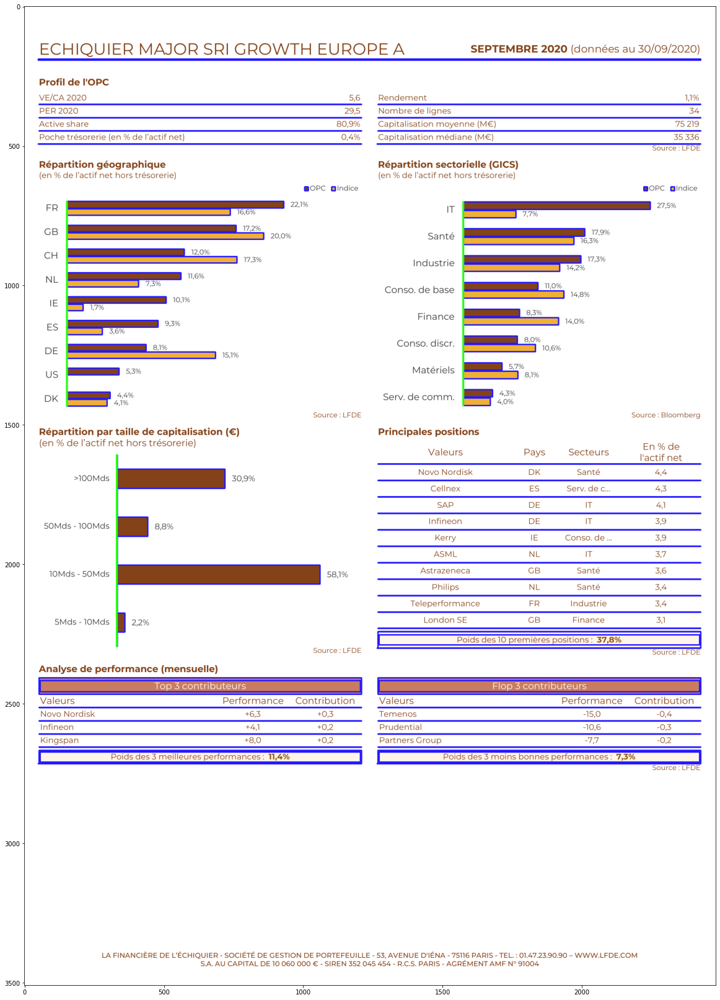

In [7]:
page=pdf_doc.pages[1]

#regions=re.extract_regions(p0)


image=page.page_image.copy()

rectangles_=page.rects+[c for c in page.curves if c.width<100 and c.height<100]
#sometimes there are duplicates in regtangle list due to pdf objects defined twice
rectangles=[]
for r in rectangles_:
    if not contains_objects(r, rectangles):
        rectangles.append(r)


edges = rects_to_edges(rectangles, page.tokens, rect_threshold=2)

for c in rectangles:
        cv2.rectangle(image, (int(c.left/page.pdf_width_scaler), int(c.top/page.pdf_height_scaler)), (int(c.right/page.pdf_width_scaler),int(c.bottom/page.pdf_height_scaler)), (36,25,255), 4)


for c in edges['v']:
    cv2.rectangle(image, (int(c['axis'].left/page.pdf_width_scaler), int(c['axis'].top/page.pdf_height_scaler)), (int(c['axis'].right/page.pdf_width_scaler),int(c['axis'].bottom/page.pdf_height_scaler)), (36,255,12), 6)

plt.imshow(image)

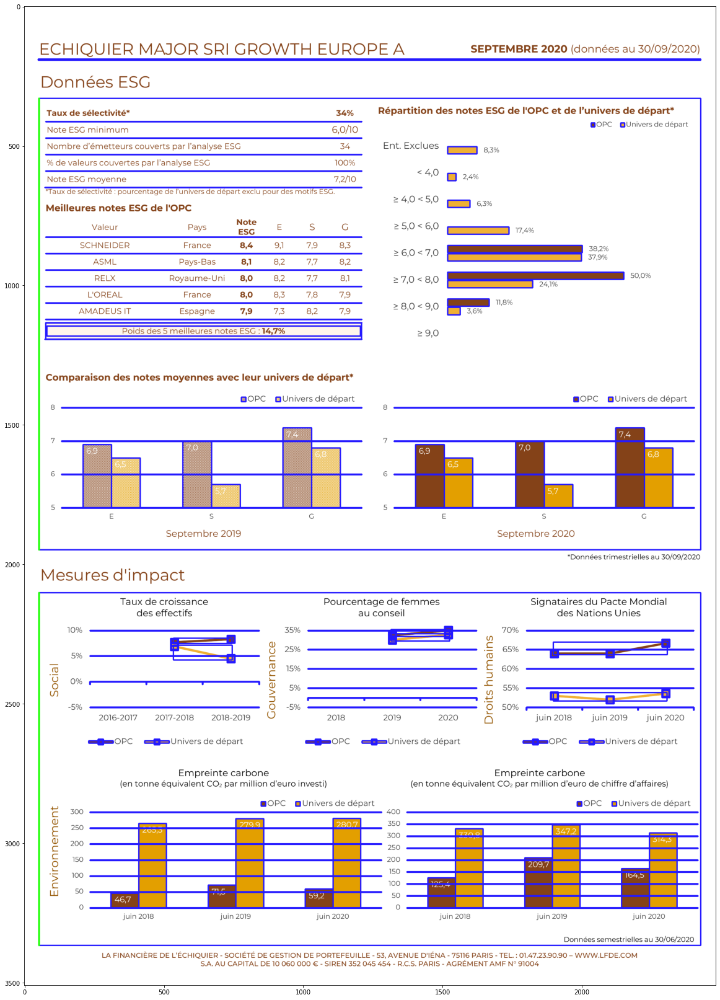

In [8]:
from pdf2txt.graph import rects_to_edges
page=pdf_doc.pages[2]


#regions=re.extract_regions(p0)


image=page.page_image.copy()

rectangles_=page.rects+[c for c in page.curves if c.width<100 and c.height<100]
#sometimes there are duplicates in regtangle list due to pdf objects defined twice
rectangles=[]
for r in rectangles_:
    if not contains_objects(r, rectangles):
        rectangles.append(r)


edges = rects_to_edges(rectangles, page.tokens, rect_threshold=2)

for c in rectangles:
        cv2.rectangle(image, (int(c.left/page.pdf_width_scaler), int(c.top/page.pdf_height_scaler)), (int(c.right/page.pdf_width_scaler),int(c.bottom/page.pdf_height_scaler)), (36,25,255), 4)


for c in edges['v']:
    cv2.rectangle(image, (int(c['axis'].left/page.pdf_width_scaler), int(c['axis'].top/page.pdf_height_scaler)), (int(c['axis'].right/page.pdf_width_scaler),int(c['axis'].bottom/page.pdf_height_scaler)), (36,255,12), 6)

plt.imshow(image)

In [16]:
#processing letter by letter boxing
def process_letter(thresh,output):	
	# assign the kernel size	
	kernel = np.ones((2,1), np.uint8) # vertical
	# use closing morph operation then erode to narrow the image	
	temp_img = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel,iterations=3)
	# temp_img = cv2.erode(thresh,kernel,iterations=2)		
	letter_img = cv2.erode(temp_img,kernel,iterations=1)
	
	# find contours 
	(contours, _) = cv2.findContours(letter_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
	
	# loop in all the contour areas
	for cnt in contours:
		x,y,w,h = cv2.boundingRect(cnt)
		cv2.rectangle(output,(x-1,y-5),(x+w,y+h),(0,255,0),1)

	return output	


#processing letter by letter boxing
def process_word(thresh,output):	
	# assign 2 rectangle kernel size 1 vertical and the other will be horizontal	
	kernel = np.ones((2,1), np.uint8)
	kernel2 = np.ones((1,4), np.uint8)
	# use closing morph operation but fewer iterations than the letter then erode to narrow the image	
	temp_img = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel,iterations=2)
	#temp_img = cv2.erode(thresh,kernel,iterations=2)	
	word_img = cv2.dilate(temp_img,kernel2,iterations=1)
	
	(contours, _) = cv2.findContours(word_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
	
	for cnt in contours:
		x,y,w,h = cv2.boundingRect(cnt)
		cv2.rectangle(output,(x-1,y-5),(x+w,y+h),(0,255,0),1)

	return output	

#processing line by line boxing
def process_line(thresh,output):	
	# assign a rectangle kernel size	1 vertical and the other will be horizontal
	kernel = np.ones((1,5), np.uint8)
	kernel2 = np.ones((2,4), np.uint8)	
	# use closing morph operation but fewer iterations than the letter then erode to narrow the image	
	temp_img = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel2,iterations=2)
	#temp_img = cv2.erode(thresh,kernel,iterations=2)	
	line_img = cv2.dilate(temp_img,kernel,iterations=5)
	
	(contours, _) = cv2.findContours(line_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
	
	for cnt in contours:
		x,y,w,h = cv2.boundingRect(cnt)
		cv2.rectangle(output,(x-1,y-5),(x+w,y+h),(0,255,0),1)

	return output	

#processing par by par boxing
def process_par(thresh,output):	
	# assign a rectangle kernel size
	kernel = np.ones((5,5), 'uint8')	
	par_img = cv2.dilate(thresh,kernel,iterations=3)
	
	(contours, _) = cv2.findContours(par_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
	
	for cnt in contours:
		x,y,w,h = cv2.boundingRect(cnt)
		cv2.rectangle(output,(x,y),(x+w,y+h),(0,255,0),1)

	return output	

#processing margin with paragraph boxing
def process_margin(thresh,output):	
	# assign a rectangle kernel size
	kernel = np.ones((20,5), 'uint8')	
	margin_img = cv2.dilate(thresh,kernel,iterations=5)
	
	(contours, _) = cv2.findContours(margin_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
	
	for cnt in contours:
		x,y,w,h = cv2.boundingRect(cnt)
		cv2.rectangle(output,(x,y),(x+w,y+h),(0,255,0),1)

	return output


In [20]:
import numpy as np
import cv2
pdf_doc=Document.open(pdfs[25])


page=pdf_doc.pages[0]
# loading images
image1 = image=page.page_image.copy()

# hardcoded assigning of output images for the 3 input images
output1_letter = image1.copy()
output1_word = image1.copy()
output1_line = image1.copy()
output1_par = image1.copy()
output1_margin = image1.copy()



gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)


# clean the image using otsu method with the inversed binarized image
ret1,th1 = cv2.threshold(gray1,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)






# processing and writing the output
output1_letter = process_letter(th1,output1_letter)
output1_word = process_word(th1,output1_word)
output1_line = process_line(th1,output1_line)
# special case for the 5th output because margin with paragraph is just the 4th output with margin
#cv2.imwrite("output/letter/output1_letter.jpg", output1_letter)	
#cv2.imwrite("output/word/output1_word.jpg", output1_word)
#cv2.imwrite("output/line/output1_line.jpg", output1_line)
output1_par = process_par(th1,output1_par)
#cv2.imwrite("output/par/output1_par.jpg", output1_par)
output1_margin = process_margin(th1,output1_par)
#cv2.imwrite("output/margin/output1_margin.jpg", output1_par)


#cv2.imshow("output letter", output1_letter)
#cv2.imshow("output word", output1_word)
#cv2.imshow("output line", output1_line)
#cv2.imshow("output par", output1_par)
#cv2.imshow("output margin", output1_par)

#cv2.waitKey(0)

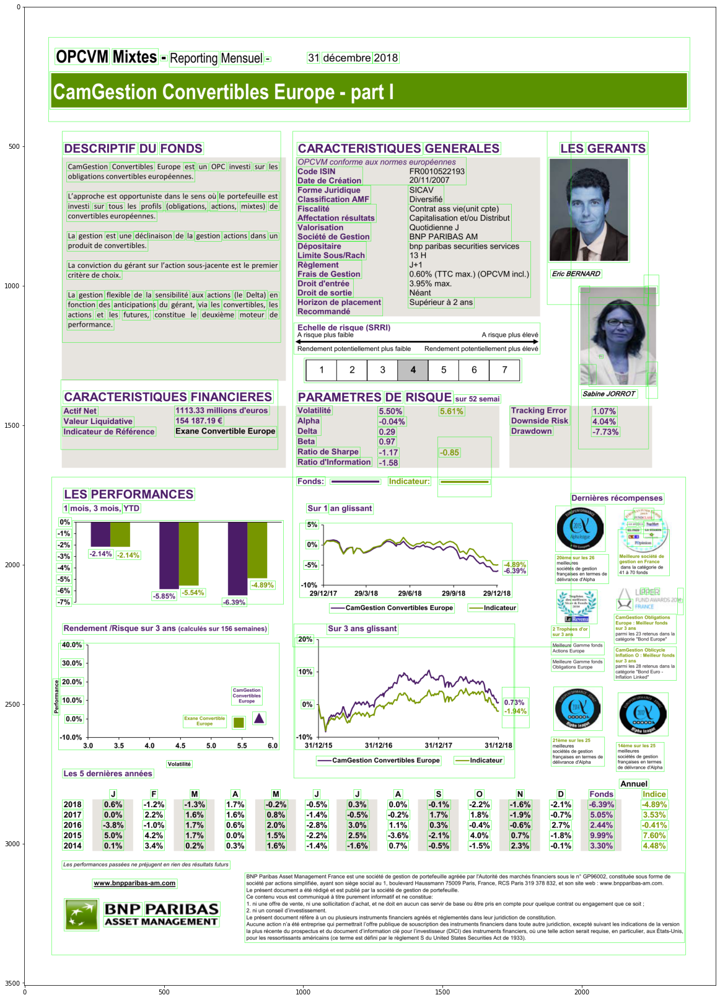

In [24]:
plt.imshow(output1_par)

In [25]:
!pip3 install layoutparser

     |████████████████████████████████| 19.1 MB 7.1 MB/s eta 0:00:011    |███████████████▍                | 9.2 MB 10.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 7.7 MB/s eta 0:00:01
     |████████████████████████████████| 249 kB 7.0 MB/s eta 0:00:01
     |████████████████████████████████| 108.8 MB 9.1 MB/s eta 0:00:01     |████████████████████▊           | 70.5 MB 10.0 MB/s eta 0:00:04
  Using cached typing_extensions-3.7.4.3-py3-none-any.whl (22 kB)
  Using cached Cython-0.29.21-cp37-cp37m-macosx_10_9_x86_64.whl (1.9 MB)
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200623-py3-none-any.whl size=41178 sha256=ae22113bbe33d582307cbbf37658a123ed66c06c8a898fe2313841c27da0c7dc
  Stored in directory: /Users/mohamedmentis/Library/Caches/pip/wheels/49/b6/01/95883c647aad104500fcff365b1cb6c401c9edf51b37407874
  Created wheel for pycocotools: filename=pycocotools-2.0.1-cp37-cp37m-macosx_10_15_x86_64.whl size=88119 sha256=7d7dfbbdbf5dc46baa100b70a32a1fb963989c696bb

In [3]:
import layoutparser as lp
model = lp.Detectron2LayoutModel('lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config')

layout = model.detect(page.page_image) 
lp.draw_box(image, layout,)

ModuleNotFoundError: No module named 'layoutparser'